# Part 1

### Goal is to cluster the data and treat them as individual datasets to train Regression models to predict ‘mpg’ 

Total Score: 25 points

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from scipy.stats import zscore
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet
from scipy.spatial.distance import pdist
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.decomposition import PCA

#### 1. Import and warehouse data: 
[ Score: 3 points ]

• Import all the given datasets and explore shape and size.

• Merge all datasets onto one and explore final shape and size.

• Export the final dataset and store it on local machine in .csv, .xlsx and .json format for future use.

• Import the data from above steps into python.

In [2]:
# Importing all the data sets

df1 = pd.read_csv('Part1 - Car name.csv')
df2 = pd.read_json('Part1 - Car-Attributes.json')

In [3]:
# Exploring Shape and Size

print ('Shape of df1 is:', df1.shape, '\nShape of df2 is:', df2.shape,'\n')
print ('Size of df1 is:', df1.size, '\nSize of df2 is:', df2.size)

Shape of df1 is: (398, 1) 
Shape of df2 is: (398, 8) 

Size of df1 is: 398 
Size of df2 is: 3184


In [4]:
# Merging df1 and df2 by columns

df3 = pd.concat([df1, df2], axis = 1)
df3.head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


In [5]:
# Exploring Shape and Size of final data df3

print('Shape of the final data:', df3.shape, '\nSize of the final data:', df3.size)

Shape of the final data: (398, 9) 
Size of the final data: 3582


In [6]:
# Exporting the final data to .csv, .xlxs, .json

df3.to_csv('Dataset.csv')
df3.to_excel('Dataset.xlsx')
df3.to_json('Dataset.json')

#### 2. Data cleansing: 
[ Score: 3 points ]

• Missing/incorrect value treatment

• Drop attribute/s if required using relevant functional knowledge

• Perform another kind of corrections/treatment on the data.

In [7]:
# Let us try to know the data

df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   car_name  398 non-null    object 
 1   mpg       398 non-null    float64
 2   cyl       398 non-null    int64  
 3   disp      398 non-null    float64
 4   hp        398 non-null    object 
 5   wt        398 non-null    int64  
 6   acc       398 non-null    float64
 7   yr        398 non-null    int64  
 8   origin    398 non-null    int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


HP is an object but as per information provided it should be continuous. It must be having some non-numeric data.

Origin is integer but it should be a categorical variable.

In [8]:
# We do not need Car Name so let's drop it.

df3.drop('car_name', axis = 1, inplace = True)

# Let us check if we have any missing value. 

df3.isnull().sum().sum()

0

In [9]:
# Let us check data for HP

df3.hp.unique()

array([130, 165, 150, 140, 198, 220, 215, 225, 190, 170, 160, 95, 97, 85,
       88, 46, 87, 90, 113, 200, 210, 193, '?', 100, 105, 175, 153, 180,
       110, 72, 86, 70, 76, 65, 69, 60, 80, 54, 208, 155, 112, 92, 145,
       137, 158, 167, 94, 107, 230, 49, 75, 91, 122, 67, 83, 78, 52, 61,
       93, 148, 129, 96, 71, 98, 115, 53, 81, 79, 120, 152, 102, 108, 68,
       58, 149, 89, 63, 48, 66, 139, 103, 125, 133, 138, 135, 142, 77, 62,
       132, 84, 64, 74, 116, 82], dtype=object)

In [10]:
# We can see a ? in hp data

df3[df3.hp == '?']

,mpg,cyl,disp,hp,wt,acc,yr,origin
32,25.0,4,98.0,?,2046,19.0,71,1
126,21.0,6,200.0,?,2875,17.0,74,1
330,40.9,4,85.0,?,1835,17.3,80,2
336,23.6,4,140.0,?,2905,14.3,80,1
354,34.5,4,100.0,?,2320,15.8,81,2
374,23.0,4,151.0,?,3035,20.5,82,1


In [11]:
# There are 6 records out of 398. We will replace it with median value.

df3 = df3.replace('?', np.nan)

df3['hp'] = df3['hp'].fillna(value= df3['hp'].median())

In [12]:
# Let us check the distribution of Origin values

df3.origin.value_counts().to_frame()

,origin
1,249
3,79
2,70


Origin 1 has more count than 2 and 3.

In [13]:
# Let us convert origin to categorical variable

df3['origin'] = df3.origin.astype('category')
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   mpg     398 non-null    float64 
 1   cyl     398 non-null    int64   
 2   disp    398 non-null    float64 
 3   hp      398 non-null    float64 
 4   wt      398 non-null    int64   
 5   acc     398 non-null    float64 
 6   yr      398 non-null    int64   
 7   origin  398 non-null    category
dtypes: category(1), float64(4), int64(3)
memory usage: 22.4 KB


In [14]:
# Let us use One Hot Encoding on categorical variable
df = df3.copy()
df = pd.get_dummies(df, columns = ['origin'])
df.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin_1,origin_2,origin_3
0,18.0,8,307.0,130.0,3504,12.0,70,1,0,0
1,15.0,8,350.0,165.0,3693,11.5,70,1,0,0
2,18.0,8,318.0,150.0,3436,11.0,70,1,0,0
3,16.0,8,304.0,150.0,3433,12.0,70,1,0,0
4,17.0,8,302.0,140.0,3449,10.5,70,1,0,0


#### 3. Data analysis & visualisation: 
[ Score: 4 points ]

• Perform detailed statistical analysis on the data.

• Perform a detailed univariate, bivariate and multivariate analysis with appropriate detailed comments after each analysis.

Hint: Use your best analytical approach. Even you can mix match columns to create new columns which can be used for better analysis. Create your own features if required. Be highly experimental and analytical here to find hidden patterns.

In [15]:
# Let us check statistics of data

df.describe()

,mpg,cyl,disp,hp,wt,acc,yr,origin_1,origin_2,origin_3
count,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,23.514573,5.454774,193.425879,104.304020,2970.424623,15.568090,76.010050,0.625628,0.175879,0.198492
std,7.815984,1.701004,104.269838,38.222625,846.841774,2.757689,3.697627,0.484569,0.381197,0.399367
min,9.000000,3.000000,68.000000,46.000000,1613.000000,8.000000,70.000000,0.000000,0.000000,0.000000
25%,17.500000,4.000000,104.250000,76.000000,2223.750000,13.825000,73.000000,0.000000,0.000000,0.000000
50%,23.000000,4.000000,148.500000,93.500000,2803.500000,15.500000,76.000000,1.000000,0.000000,0.000000
75%,29.000000,8.000000,262.000000,125.000000,3608.000000,17.175000,79.000000,1.000000,0.000000,0.000000
max,46.600000,8.000000,455.000000,230.000000,5140.000000,24.800000,82.000000,1.000000,1.000000,1.000000


MPG data looks normally distributed with some outliers.

Cylinders Q1, Q2 and Q3, Max are equal. Also mean is greater than median. This might have left skewed distribution.

Displacement may also be left skewed with some outliers.

For Horsepower and Weight, median and mean are almost equal but may have a log tail due to outliers.

Acceleration and Year seems to be normally distributed.

For Origin_1, less than 50% is for Origin 2 and 3. Also in Origin 2 and 3 Q3 is zero, so the count for these two origins are less compared to origin 1.


#### Univariate Analysis

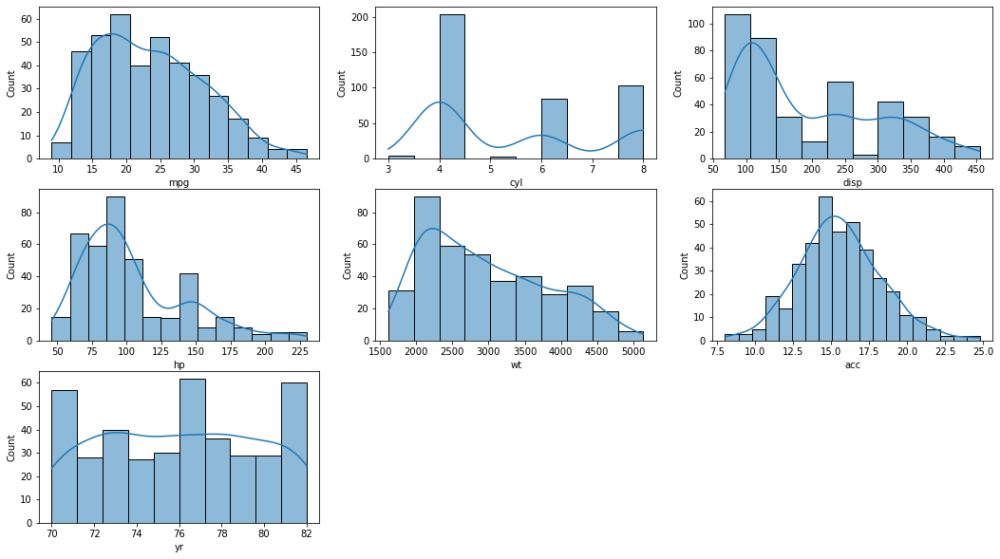

In [16]:
# Let us check histogram for each variable

plt.figure(figsize = (18,10))
i = 1
for j in df.describe().T.index:
    plt.subplot(3,3,i)
    sns.histplot(data = df, x = j, kde = True)
    i += 1
    if i > 7:
        break

MPG: Slightly skewed towards right. 

Cylinders: Odd number of cylinders are very less compared to even number.

Displacement: Count is reducing as displacement increases. Max displacement is between around 80 to 150.

Horsepower: It has a tail towards right. It seems to have some outliers.

Weight: Max count of weight is in between 2000 to 2500. It has skewness towards right.

Acceleration: It is normally distributed with mean around 15-16.

Year: Distribution accross the year is almost equal.

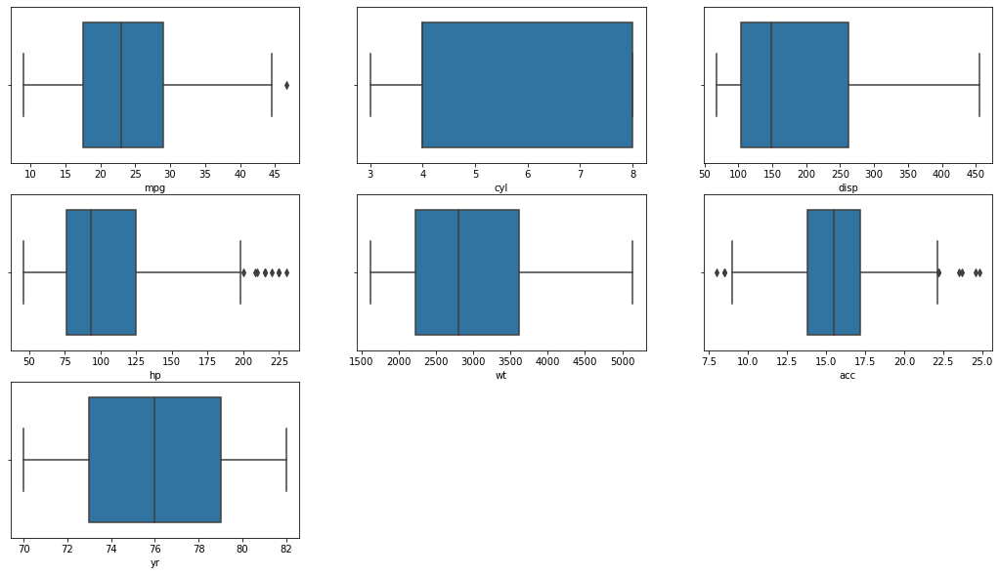

In [17]:
# Let us check box plot for each variable

plt.figure(figsize = (18,10))
i = 1
for j in df.describe().T.index:
    plt.subplot(3,3,i)
    sns.boxplot(data = df, x = j);
    i += 1
    if i > 7:
        break

There are outliers in MPG, Horsepower and Acceleration.

MPG has only a few outliers. Upper whisker kength is more so we can say it is right skewed.

Cylinder Upper quartile is max value and 50% is lower qurtile. This shows inconsistency in the distribution.

Dispersion has long upper whisker. Data is highly right skewed with a long tail towards right. median is 150 and Max value is 450.

Horsepower is also right skewed with outliers.

Weight is right skewed with no outliers.

Acceleration is normally distributed and has some outliers on both sides.

Year is also seems to be distribued normally.

#### Bivariate Analysis

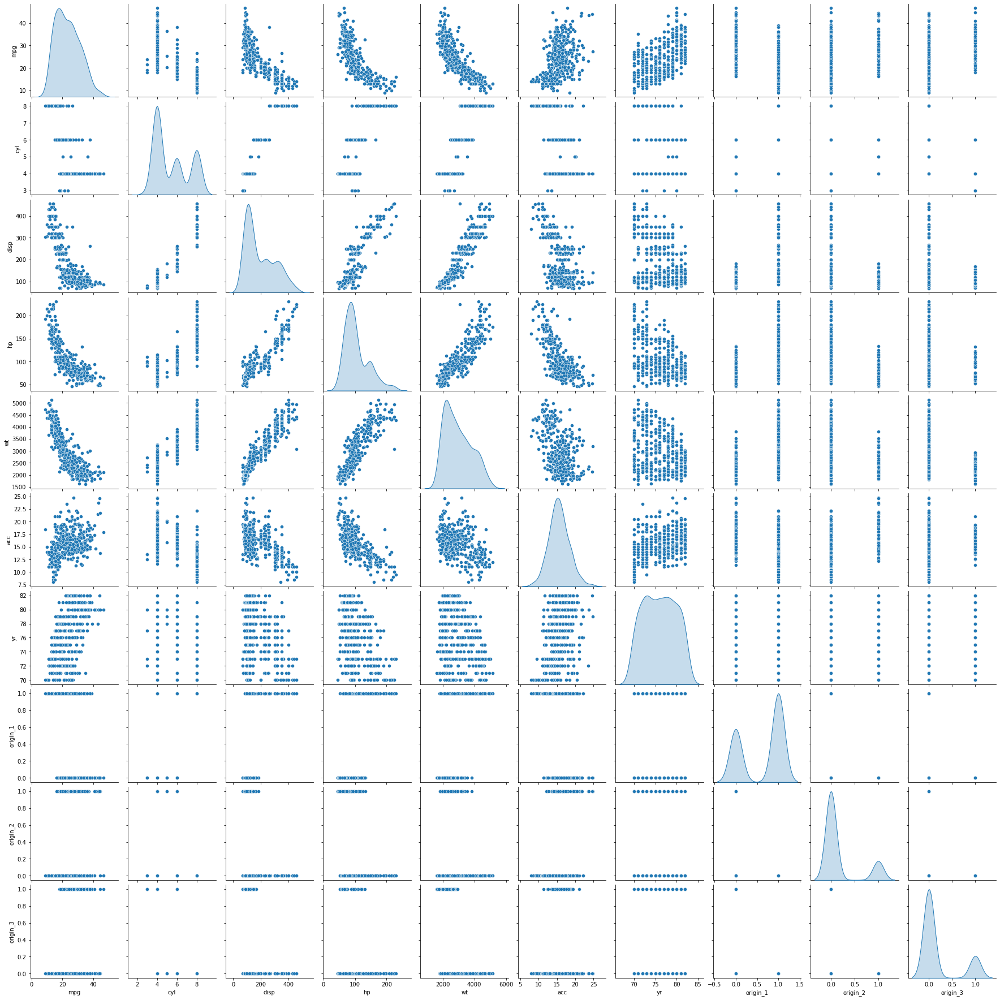

In [18]:
# Pairplot

sns.pairplot(df, diag_kind = 'kde');

MPG, Weight, Horsepower and Dispersion are correlated with each other. Data for year is almost equally distributed in all variables. It does not have any correlation.

MPG: As number of Cylinders increases MPG decreses. As Year increases MPG increases. Origin 1 is more tends towards less MPG than Origin 2 and 3.

Cylinders: It is directly proportional to Dispersion, HP and Weight and inversly proportional to Acceleration. Origin 1 has more number of cylinders and Origin 3 has less number of cylinders.

Dispersion: It is directly proportional to Horsepower and Weight but inversly to Acceleration. Origin 2 and 3 have less dispersion than Origin 1.

Horsepower: It has bimodal graph. It is directly proportional to Weight and inversly to Acceleration. Origin 2 and 3 have less horsepower than Origin 1.

Acceleration: Less acceleration for Origin 1 and more in Origin 2.

Data for Origin 1 is more than combined data of Origin 2 and 3.

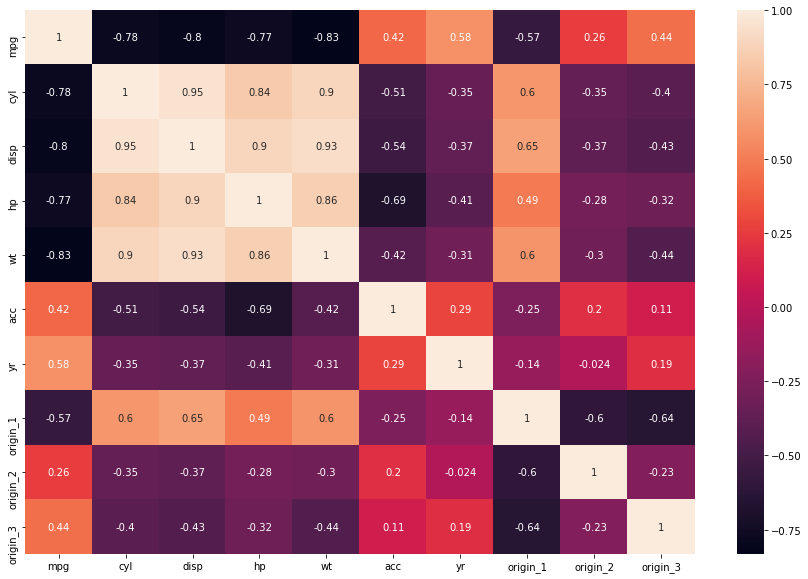

In [19]:
# Heatmap to check correlation

plt.figure(figsize = (15,10))
sns.heatmap(data = df.corr(), annot = True);

MPG is inversly correlated with Cylinders, Dispersion, Horsepower and Weight.

There is a strong correlation among MPG, Cylinders, DIspersion, Horsepower and Weight.

Horsepower and Acceleration is inversly correlated.

#### Multivariate Analysis

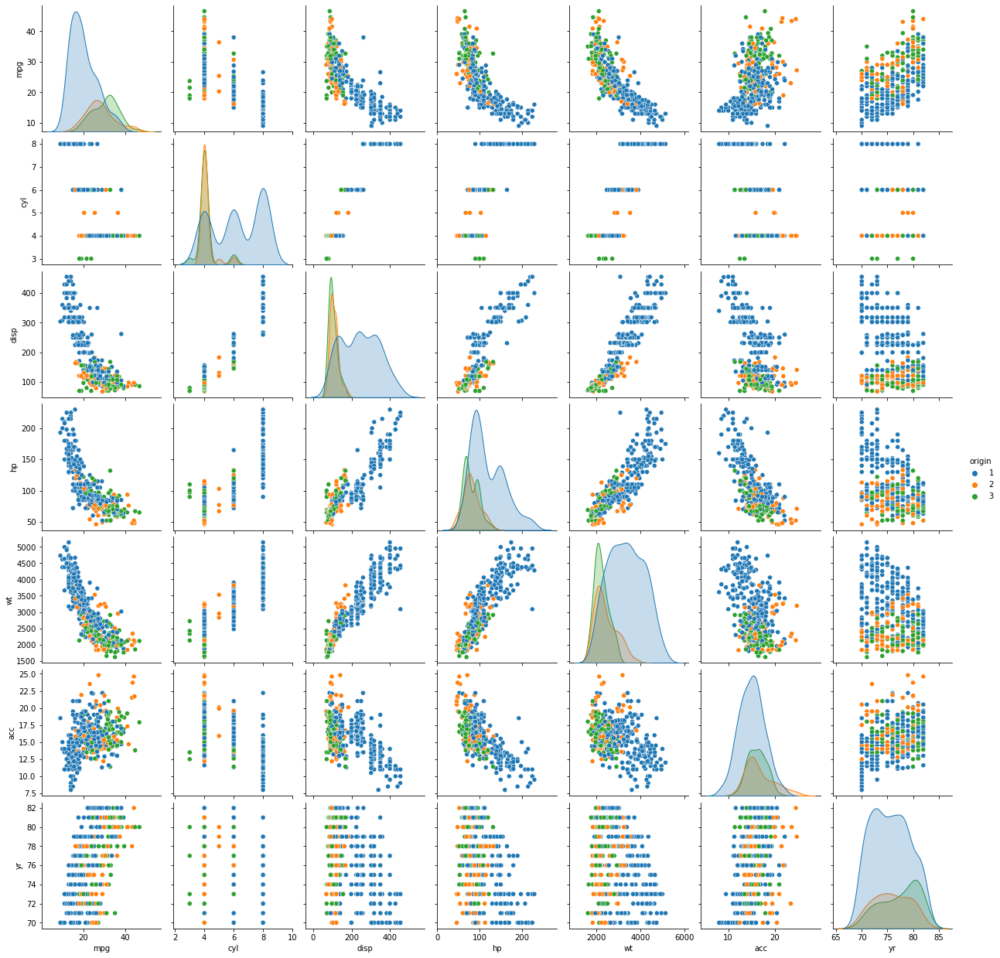

In [20]:
# Let us use df3 with origin column
# We will check if Origin can help us classify the data

sns.pairplot(df3, diag_kind = 'kde', hue = 'origin');

From above plot in some cases we will be able to see clearly difference between Origin 1 and Origin 2 and 3. But there is not much difference between 2 and 3.

MPG: There is no clear distribution less MPG then origin 1.

Cylinders: we can say if cylinders are more than 6 then it is from origin 1. 3 cylinderes is only from Origin 3 and 5 cylinders only from origin 2.

Dispersion, Horsepower, Weight: If dispersion is more than 200, horsepower more than 150, weight more than 4000 then it is from orign 1.

We will check other variables as well.

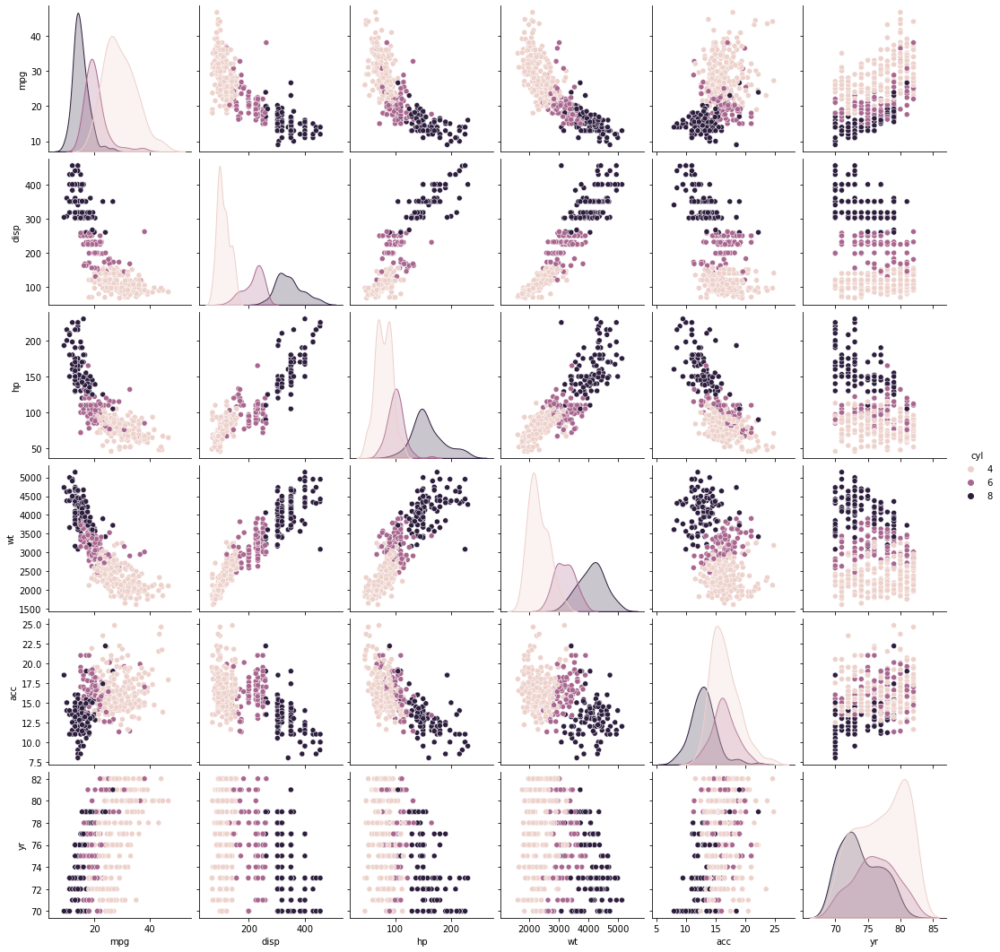

In [21]:
# Let us combine cylinders as there are very less for 3 and 5.
# Combining cylinders 3 with 4, 5 with 6, 7 with 8.

df_cyl = df3.copy()
df_cyl['cyl'] = df_cyl['cyl'].replace(3,4).replace(5,6)
df_cyl.cyl.unique()

sns.pairplot(df_cyl, diag_kind = 'kde', hue = 'cyl');

In above chart we can mostly see separtion among 3 types of cylinders clearly. Cylinder will be a good factor to cluster the data.

There is much clear separation between dispersion and mpg. We can specify clearly if we have data for dispersion and cylinders.



### 4. Machine learning: 
[ Score: 8 points ]

• Use K Means and Hierarchical clustering to find out the optimal number of clusters in the data.

• Share your insights about the difference in using these two methods. 

In [22]:
# Scaling data as different scales are available.

df_z = df.apply(zscore)
df_z.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin_1,origin_2,origin_3
0,-0.706439,1.498191,1.090604,0.673118,0.630870,-1.295498,-1.627426,0.773559,-0.461968,-0.497643
1,-1.090751,1.498191,1.503514,1.589958,0.854333,-1.477038,-1.627426,0.773559,-0.461968,-0.497643
2,-0.706439,1.498191,1.196232,1.197027,0.550470,-1.658577,-1.627426,0.773559,-0.461968,-0.497643
3,-0.962647,1.498191,1.061796,1.197027,0.546923,-1.295498,-1.627426,0.773559,-0.461968,-0.497643
4,-0.834543,1.498191,1.042591,0.935072,0.565841,-1.840117,-1.627426,0.773559,-0.461968,-0.497643


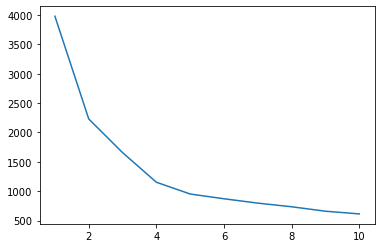

In [23]:
# Let us create clustering using K-means
# Let us find K value:

wss = []
for i in range(1,11):
    KM = KMeans(n_clusters = i, random_state = 0)
    KM.fit(df_z)
    wss.append(KM.inertia_)
    
plt.plot(range(1,11), wss);

Elbow can be seen at 2, 4 and 5. We will check silhouette score to finalize k value.

In [24]:
# K-means = 2

km = KMeans(n_clusters = 2, random_state = 1)
km.fit(df_z)
labels2 = km.labels_
print(silhouette_score(df_z, labels2))

# K-means = 4

km = KMeans(n_clusters = 4, random_state = 1)
km.fit(df_z)
labels4 = km.labels_
print(silhouette_score(df_z, labels4))

# K-Means = 5

km = KMeans(n_clusters = 5, random_state = 1)
km.fit(df_z)
labels5 = km.labels_
print(silhouette_score(df_z, labels5))

0.3775036358562444
0.4426923929985603
0.4066037766692289


Silhoutte score near to 1 considered to be good. So we will finalize k value of 4.

In [25]:
df['Clust4_k'] = labels4

df_mean = df.groupby('Clust4_k').mean().round(2)
df_mean['Freq_k'] = df.Clust4_k.value_counts().sort_index()

df_mean

,mpg,cyl,disp,hp,wt,acc,yr,origin_1,origin_2,origin_3,Freq_k
Clust4_k,,,,,,,,,,,
0,23.69,5.09,178.47,90.51,2848.52,16.59,76.86,1,0,0,149
1,14.72,7.98,346.37,160.55,4126.91,12.72,73.75,1,0,0,100
2,30.45,4.10,102.71,79.84,2221.23,16.17,77.44,0,0,1,79
3,27.89,4.16,109.14,80.93,2423.30,16.79,75.81,0,1,0,70


Frequency of the clusters vary significantly. 

There is not much difference between cluster 2 and 3. The only difference is of origin.

Cluster 1 is prominantly different from other clusters almost in all the variables.

Cluster 0 is also different but not easily identifiable.

Let us check box plots to get more clarity.

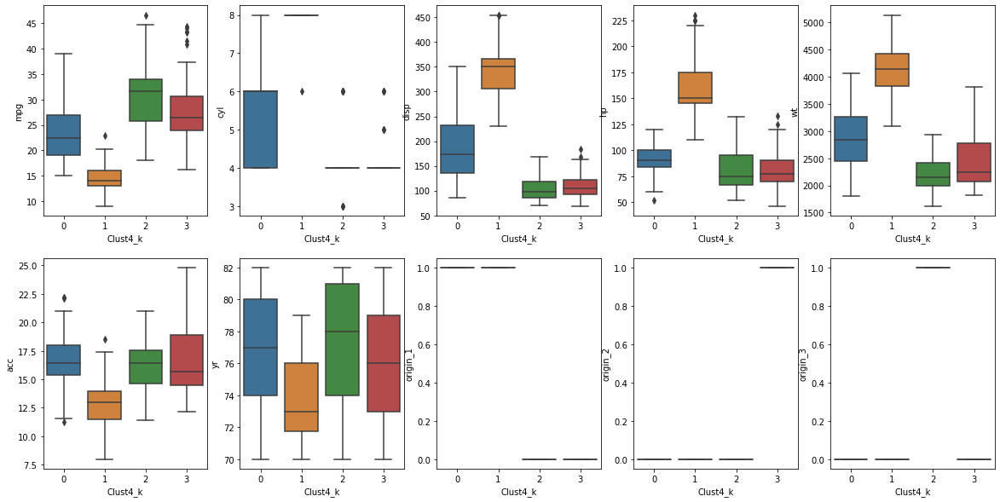

In [26]:
plt.figure(figsize = (20,10))
i = 1
for j in df.describe().T.index:
    plt.subplot(2, 5, i)
    sns.boxplot(data = df, x = 'Clust4_k', y = j, saturation = 0.6)
    i += 1
    if i > 10:
        break

As our earlier observation, we can see here that cluster 1 is significantly different than other clusters.

If we observe Origins, Origin 1 is in Cluster 0 and 1, Origin 2 is in Cluster 3 and Origin 3 is in Cluster 2.

We want to predict mpg, so low values of acceleration and year with high values of dispersion, hp, weight is resulting is low mpg. And similar for high mpg.

Cluster 2 and 3 are almost similar except origin.

Cluster 0 is in between cluster 1 and cluster 2 & 3.

0.7693018385200214


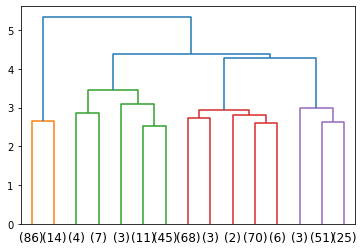

In [27]:
# Let us check by Hierarchical Clustering
# We will use same scaled data for hierarchical clustering as well

Z = linkage(df_z, metric='euclidean', method='average')
c, coph_dists = cophenet(Z , pdist(df_z))
print(c)
label_list = np.array(df_z.index)
dend = dendrogram(Z, truncate_mode = 'lastp', p = 15, labels = label_list)

Higher the C better the model is.

We can clearly see how the 4 clusters are forming if we check at y scale at around 4.

In [28]:
# Let us form 4 clusters

AC = AgglomerativeClustering(n_clusters = 4, affinity = 'Euclidean', linkage = 'average')
AC.fit(df_z)

df['Clust4_h'] = AC.labels_

df_meanh = df.groupby('Clust4_h').mean()
df_meanh['Freq_h'] = df.Clust4_h.value_counts().sort_index()

df_meanh.round(2)

,mpg,cyl,disp,hp,wt,acc,yr,origin_1,origin_2,origin_3,Clust4_k,Freq_h
Clust4_h,,,,,,,,,,,,
0,27.89,4.16,109.14,80.93,2423.30,16.79,75.81,0,1,0,3.00,70
1,23.71,5.09,179.08,90.61,2852.11,16.60,76.87,1,0,0,0.01,149
2,30.45,4.10,102.71,79.84,2221.23,16.17,77.44,0,0,1,2.00,79
3,14.68,7.98,345.47,160.40,4121.56,12.70,73.74,1,0,0,0.99,100


We can see extreme values in Cluster 2 and 3. 

Cluster 3 is significantly different from other clusters.

Frequencies are similar to the K-means clustering. The distribution is same, so I think clusters are similar with slight difference.

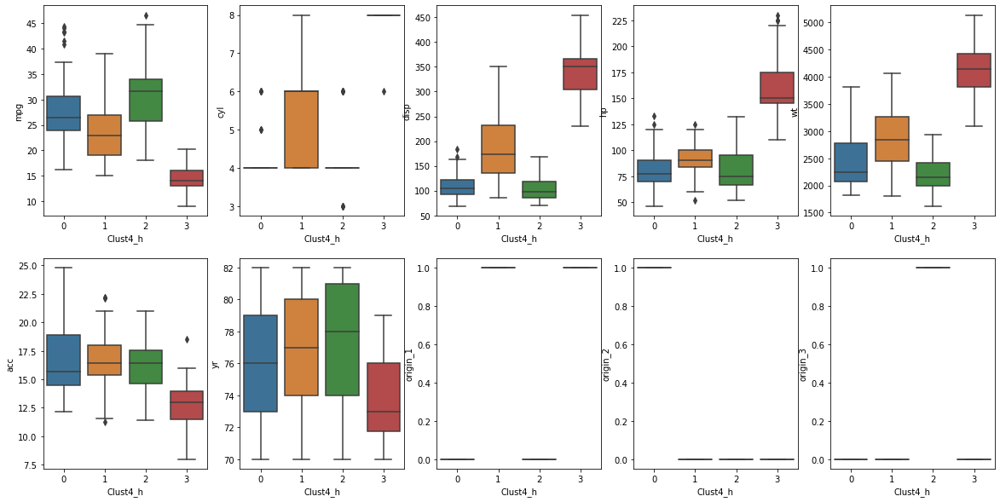

In [29]:
plt.figure(figsize = (20,10))
i = 1
for j in df.describe().T.index:
    plt.subplot(2, 5, i)
    sns.boxplot(data = df, x = 'Clust4_h', y = j, saturation = 0.6)
    i += 1
    if i > 10:
        break

It is almost similar to K-Means clustering.

Cluster 3 is significantly different than other clusters.

We want to predict mpg, so low values of acceleration and year with high values of dispersion, hp, weight is resulting is low mpg. And similar for high mpg.

Cluster 0 and 2 are almost similar except origin.

From both methods we found similar clusters. In Hierarchical clustering it was easy to finalize number of clusters due to visualization. But it was also easy for K-means because of Silhouette score.

#### 5. Answer below questions based on outcomes of using ML based methods. 
[ Score: 5 points ]

• Mention how many optimal clusters are present in the data and what could be the possible reason behind it.

• Use linear regression model on different clusters separately and print the coefficients of the models individually

• How using different models for different clusters will be helpful in this case and how it will be different than using one single model without clustering? Mention how it impacts performance and prediction.

**Answer:**

Four optimal clusters are present in the data from above analysis from K-Means clustering and Hierarchical clustering.

Variables are having large range and there is a lot of overlap when we see each variable seperately. So I think to differentiate from one another more clusters are needed.

From pairplot which we saw in univariate analysis, we can see three modals in a few variables. So the data for 3 is mixed. But from visualization of a dendrogram and Silhoutte score 4 clusters is a better option.

In [30]:
# Let's use Linear regression model on a complete data.

lr_model = LinearRegression()
data = df
X = data.iloc[:, 1:10]
y = data.iloc[:, 0:1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 10)
lr_model.fit(X_train, y_train)
print('R-square on training data is:', lr_model.score(X_train, y_train).round(4))
print('R-square on testing data is:', lr_model.score(X_test, y_test).round(4))
print ('coefficient is: \n', lr_model.coef_.round(2))
print('')

R-square on training data is: 0.8223
R-square on testing data is: 0.8248
coefficient is: 
 [[-0.53  0.03 -0.02 -0.01  0.11  0.77 -2.08  1.12  0.96]]



R-square values for testing and training are quite close. And above 80%.

Coefficients are also not that big. A few coefficients are around 1 but otherwise it looks good.

In [31]:
# Let's use Linear regression model on clusters of K Means

lr_model = LinearRegression()
for i in range(0,4):
    data = df[df['Clust4_k'] == i]
    X = data.iloc[:, 1:10]
    y = data.iloc[:, 0:1]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 10)
    lr_model.fit(X_train, y_train)
    print(f'For cluster {i} R-square on training data is:', lr_model.score(X_train, y_train).round(4))
    print(f'For cluster {i} R-square on testing data is:', lr_model.score(X_test, y_test).round(4))
    print ('coefficient is: \n', lr_model.coef_.round(2))
    print('')

For cluster 0 R-square on training data is: 0.843
For cluster 0 R-square on testing data is: 0.6892
coefficient is: 
 [[ 1.03 -0.03 -0.08 -0.   -0.39  0.7   0.    0.    0.  ]]

For cluster 1 R-square on training data is: 0.6449
For cluster 1 R-square on testing data is: 0.1639
coefficient is: 
 [[-0.98  0.02 -0.04 -0.   -0.04  0.35  0.    0.    0.  ]]

For cluster 2 R-square on training data is: 0.6784
For cluster 2 R-square on testing data is: 0.7467
coefficient is: 
 [[ 0.47  0.06 -0.02 -0.01  0.33  1.02  0.    0.    0.  ]]

For cluster 3 R-square on training data is: 0.8039
For cluster 3 R-square on testing data is: 0.4946
coefficient is: 
 [[-1.31 -0.01 -0.02 -0.01  0.47  1.38  0.    0.    0.  ]]



There is much difference of R square scores between training and testing data. Linear model is not giving good results on there clusters.

A few of the coefficients are around 1, but not big. We cannot use linear model as its accuracy is not good.

In [32]:
# Let's use Linear regression model on clusters of Hierarchical clustering

for i in range(0,4):
    data = df[df['Clust4_h'] == i]
    X = data.iloc[:, 1:10]
    y = data.iloc[:, 0:1]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 10)
    lr_model.fit(X_train, y_train)
    print(f'For cluster {i} R-square on training data is:', lr_model.score(X_train, y_train).round(4))
    print(f'For cluster {i} R-square on testing data is:', lr_model.score(X_test, y_test).round(4))
    print ('coefficient is: \n', lr_model.coef_.round(2))
    print('')

For cluster 0 R-square on training data is: 0.8039
For cluster 0 R-square on testing data is: 0.4946
coefficient is: 
 [[-1.31 -0.01 -0.02 -0.01  0.47  1.38  0.    0.    0.  ]]

For cluster 1 R-square on training data is: 0.8334
For cluster 1 R-square on testing data is: 0.6772
coefficient is: 
 [[ 1.25 -0.02 -0.08 -0.01 -0.35  0.75  0.    0.    0.  ]]

For cluster 2 R-square on training data is: 0.6784
For cluster 2 R-square on testing data is: 0.7467
coefficient is: 
 [[ 0.47  0.06 -0.02 -0.01  0.33  1.02  0.    0.    0.  ]]

For cluster 3 R-square on training data is: 0.6651
For cluster 3 R-square on testing data is: 0.365
coefficient is: 
 [[-0.4   0.   -0.03 -0.   -0.31  0.39  0.    0.    0.  ]]



Same as in K-means, in Hierarchical clustering also there is a significant difference in training and testing data accuracy score.

Coefficients are good enough.

**How using different models for different clusters will be helpful in this case and how it will be different than using one single model without clustering? Mention how it impacts performance and prediction**

If we perform linear model directly on data then it is giving us good results but if we perform same model on different clusters we are getting poor results.

Now, K-Means and Hierarchical clustering depends on how close the data points are. But in Linear Regression it tries to fit points in a line. In all the methods we calculate distances but the methods makes a difference.

On clustered data which are closer to each other not necessarily in a line, we are getting good results in clustering model but bad results in linear.

So from this we can say, we need to understand the data first and then decide which model will be suitable and use accordingly.

#### 6. Improvisation: 
[ Score: 2 points ]

• Detailed suggestions or improvements or on quality, quantity, variety, velocity, veracity etc. on the data points collected by the company to perform a better data analysis in future.

**Answer**

More data would have helped us analyse the data better. Data was not equally distributed, for Origin 2 and 3 very less data was available. Also data was too much dispersed, it had a wide range.

There were some missing values, if we can get clean data, it would give better results.

# Part 2
[ Total Score: 5 points]

Company X curates and packages wine across various vineyards spread throughout the country

Goal is to build a synthetic data generation model using the existing data provided by the company



#### 1. Design a synthetic data generation model which can impute values [Attribute: Quality] wherever empty the company has missed recording the data.

In [33]:
# Import Data

data = pd.read_excel('Part2 - Company.xlsx')
data.head()

,A,B,C,D,Quality
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,NaN
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A


In [34]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   A        61 non-null     int64 
 1   B        61 non-null     int64 
 2   C        61 non-null     int64 
 3   D        61 non-null     int64 
 4   Quality  43 non-null     object
dtypes: int64(4), object(1)
memory usage: 2.5+ KB


In [35]:
data.isnull().sum()

A           0
B           0
C           0
D           0
Quality    18
dtype: int64

In [36]:
# Let us check what all values are there in Quality

data.Quality.unique()

array(['Quality A', 'Quality B', nan], dtype=object)

In [37]:
# We will drop Quality column and create 2 clusters because we have 2 types of quality

data1 = data.copy()
data1.drop('Quality', axis = 1, inplace = True)
data1.head()

,A,B,C,D
0,47,27,45,108
1,174,133,134,166
2,159,163,135,131
3,61,23,3,44
4,59,60,9,68


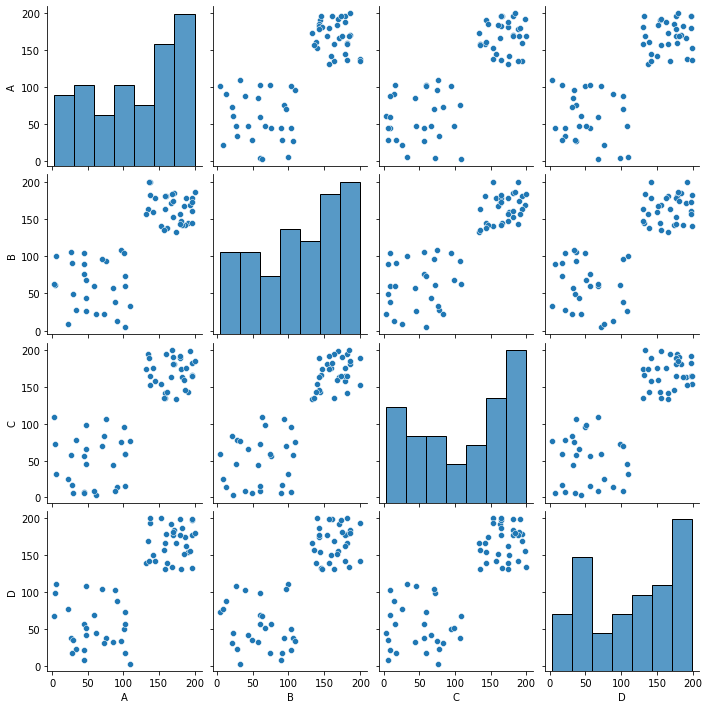

In [38]:
sns.pairplot(data1);

We see a clear seperation between 2 groups. Let us try clustering.

In [39]:
# We will use both Unsupervised Learning techniques K-Means and Hirarchical
# No need to scale the data because it does not have any scales
# We want 2 clusters so we will go for k-value of 2

km = KMeans(n_clusters = 2, random_state = 10)
km.fit(data1)
labels = km.labels_
data['Cluster'] = labels
data.head()

,A,B,C,D,Quality,Cluster
0,47,27,45,108,Quality A,1
1,174,133,134,166,Quality B,0
2,159,163,135,131,NaN,0
3,61,23,3,44,Quality A,1
4,59,60,9,68,Quality A,1


In [40]:
data.groupby('Quality').median()

,A,B,C,D,Cluster
Quality,,,,,
Quality A,53.5,62.0,58.0,46.5,1
Quality B,170.0,168.0,176.0,168.0,0


From above we can say that Cluster 0 is for to Quality B and 1 is for Quality A.

Now we can impute the values.

In [41]:
data['Cluster'].replace(0, 'Quality B', inplace = True)
data['Cluster'].replace(1, 'Quality A', inplace = True)

data.head()

,A,B,C,D,Quality,Cluster
0,47,27,45,108,Quality A,Quality A
1,174,133,134,166,Quality B,Quality B
2,159,163,135,131,NaN,Quality B
3,61,23,3,44,Quality A,Quality A
4,59,60,9,68,Quality A,Quality A


**We have imputed values of Quality in column 'Cluster'**

# Part 3

Total Score: 20

The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles.

Apply dimensionality reduction technique – PCA and train a model using principal components instead of training the
model using just the raw data

#### 1. Data: Import, clean and pre-process the data

In [42]:
# Let us import the data and check shape
data = pd.read_csv('Part3 - vehicle.csv')
data.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [43]:
data.shape

(846, 19)

We have 19 columns, we will need to use PCA.

In [44]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

In [45]:
# Data type looks good. We just need categorical for class

data['class'] = data['class'].astype('category')

In [46]:
data.describe()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
count,846.000000,841.000000,842.000000,840.000000,844.000000,846.000000,845.000000,845.000000,843.000000,846.000000,843.000000,844.000000,844.000000,842.000000,840.000000,845.000000,845.000000,846.000000
mean,93.678487,44.828775,82.110451,168.888095,61.678910,8.567376,168.901775,40.933728,20.582444,147.998818,188.631079,439.494076,174.709716,72.447743,6.364286,12.602367,188.919527,195.632388
std,8.234474,6.152172,15.778292,33.520198,7.891463,4.601217,33.214848,7.816186,2.592933,14.515652,31.411004,176.666903,32.584808,7.486190,4.920649,8.936081,6.155809,7.438797
min,73.000000,33.000000,40.000000,104.000000,47.000000,2.000000,112.000000,26.000000,17.000000,118.000000,130.000000,184.000000,109.000000,59.000000,0.000000,0.000000,176.000000,181.000000
25%,87.000000,40.000000,70.000000,141.000000,57.000000,7.000000,147.000000,33.000000,19.000000,137.000000,167.000000,318.000000,149.000000,67.000000,2.000000,5.000000,184.000000,190.250000
50%,93.000000,44.000000,80.000000,167.000000,61.000000,8.000000,157.000000,43.000000,20.000000,146.000000,179.000000,363.500000,173.500000,71.500000,6.000000,11.000000,188.000000,197.000000
75%,100.000000,49.000000,98.000000,195.000000,65.000000,10.000000,198.000000,46.000000,23.000000,159.000000,217.000000,587.000000,198.000000,75.000000,9.000000,19.000000,193.000000,201.000000
max,119.000000,59.000000,112.000000,333.000000,138.000000,55.000000,265.000000,61.000000,29.000000,188.000000,320.000000,1018.000000,268.000000,135.000000,22.000000,41.000000,206.000000,211.000000


In [47]:
data.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

In [48]:
# Let us replace blank values with median

for j in data.columns:
    if data[j].isnull().sum() > 0:
        data[j] = data[j].fillna(value = data[j].median())
data.isnull().sum().sum()

0

#### 2. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden patterns by using all possible methods.
For example: Use your best analytical approach to build this report. Even you can mix match columns to create new columns which can be used for better analysis. Create your own features if required. Be highly experimental and analytical here to find hidden patterns.

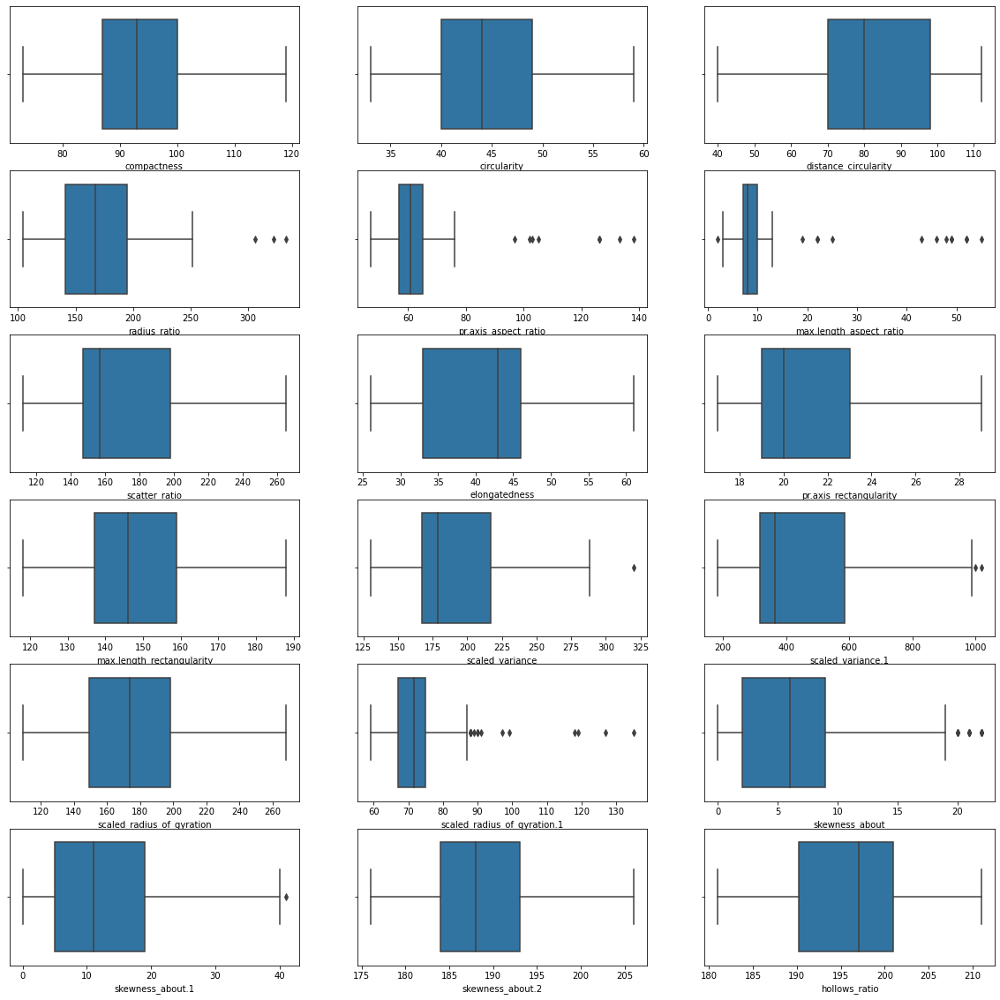

In [49]:
# Let us do Univariate analysis

plt.figure(figsize = (20, 20))
i = 1
for j in data.describe().T.index:
    plt.subplot(6, 3, i)
    sns.boxplot(data = data, x = j)
    i += 1
    if i > 19:
        break

We can see that there are outliers present for a few variables such as radius_ratio, pr.axis_aspect_ratio, max.length_aspect_ratio, scaled_variance, scaled_variance.1, scaled_radius_of_gyration.1, skewness_about.

A few of the variables are right skewed and a few left skewed.

In [50]:
# Let us replace outliers with whiskers

Q1 = data.quantile(.25)
Q3 = data.quantile(.75)
IQR = Q3 - Q1

In [51]:
# These values are outliers. We will replcae these.

np.where((data.iloc[:,:18] < (Q1 - 1.5 * IQR)) | (data.iloc[:,:18] > (Q3 + 1.5 * IQR)))

(array([  4,   4,   4,  37,  37,  37,  37,  44,  47,  79,  85, 100, 100,
        100, 113, 123, 127, 132, 135, 135, 135, 135, 190, 230, 291, 291,
        291, 346, 381, 388, 388, 388, 388, 388, 391, 400, 498, 505, 516,
        523, 523, 523, 544, 623, 655, 655, 706, 706, 706, 761, 796, 797,
        815, 815, 835]),
 array([ 4,  5, 13,  3,  4,  5, 13, 14, 13, 13, 11,  4,  5, 13, 14, 14,  5,
        15,  3,  4,  5, 13, 14, 13,  4,  5, 13, 14, 13,  3,  4,  5, 10, 13,
         5, 14, 13, 14, 14,  4,  5, 13,  5, 14,  5, 13,  4,  5, 13, 14, 14,
        14,  5, 13, 11]))

In [52]:
# Replace every outlier on the lower side by the lower whisker
for i, j in zip(np.where(data.iloc[:,:18] < Q1 - 1.5 * IQR)[0], np.where(data.iloc[:,:18] < Q1 - 1.5 * IQR)[1]): 
    
    whisker  = Q1 - 1.5 * IQR
    data.iloc[i,j] = whisker[j]
    
    
#Replace every outlier on the upper side by the upper whisker    
for i, j in zip(np.where(data.iloc[:,:18] > Q3 + 1.5 * IQR)[0], np.where(data.iloc[:,:18] > Q3 + 1.5 * IQR)[1]):
    
    whisker  = Q3 + 1.5 * IQR
    data.iloc[i,j] = whisker[j]    

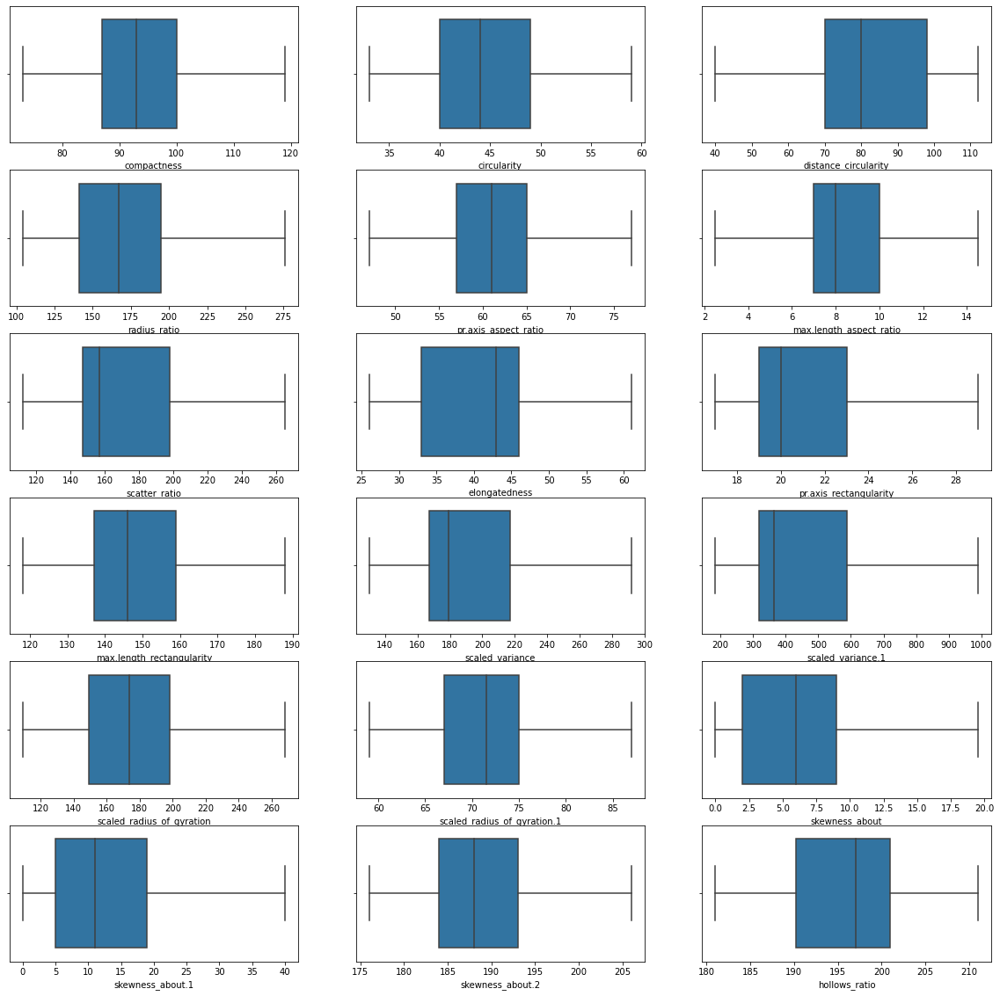

In [53]:
# After replacing, let us check again for outliers

plt.figure(figsize = (20, 20))
i = 1
for j in data.describe().T.index:
    plt.subplot(6, 3, i)
    sns.boxplot(data = data, x = j)
    i += 1
    if i > 19:
        break

We do not see any outliers now.

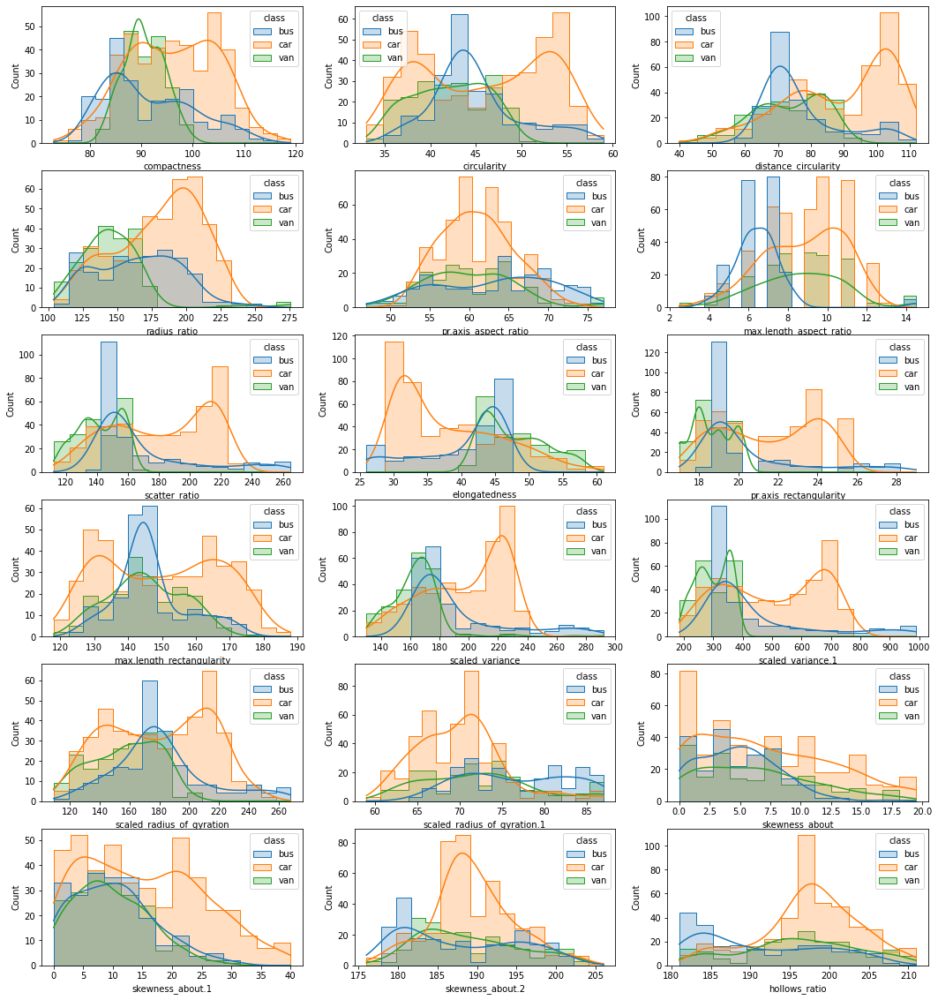

In [54]:
# Bivariate
# Let us check distribution of data under different class

plt.figure(figsize = (18,20))
i = 1
for j in data.describe().T.index:
    plt.subplot(6,3,i)
    sns.histplot(data = data, x = j, kde = True, hue = 'class', element = 'step')
    i += 1
    if i > 19:
        break

There is prominant difference of class car than other two. Data for van and bus are almost merged also it is merged with car as well. 

In most of the variables we can see bimodal behaviour.  It signifies that the data contains mixed segmentations.

We will do more analysis further.

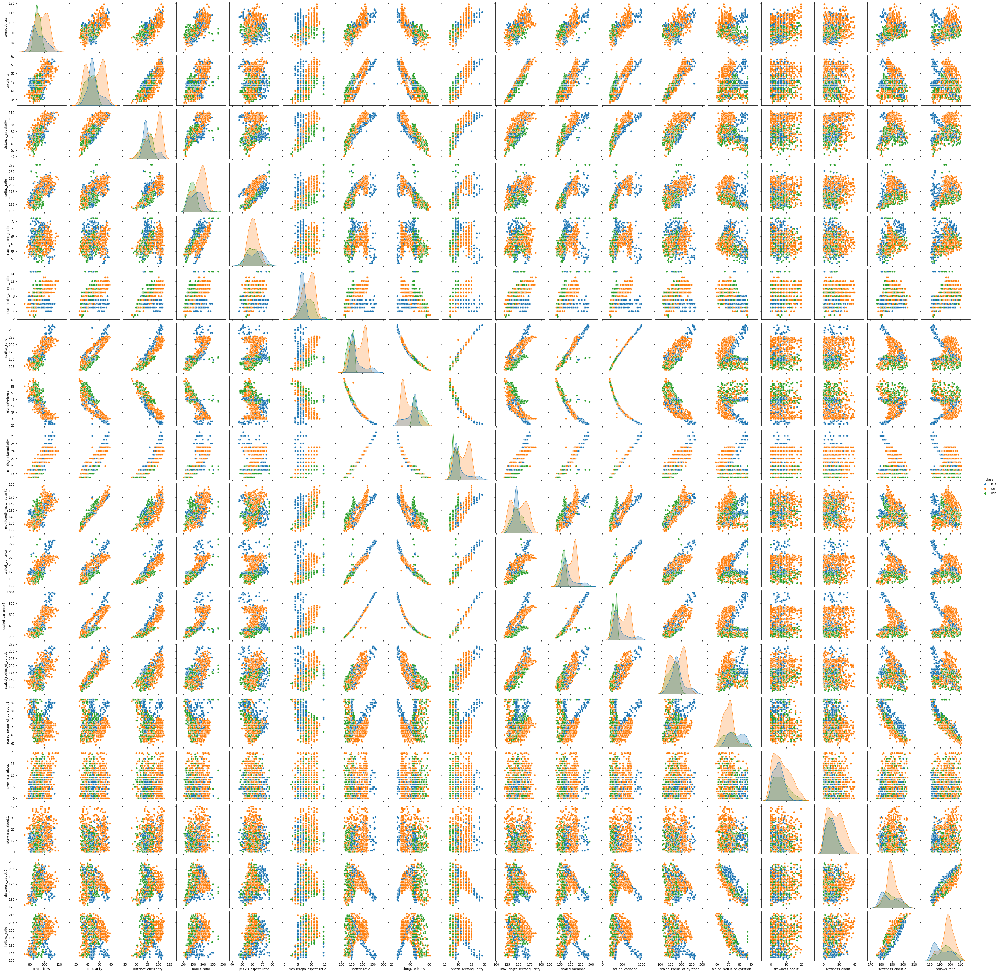

In [55]:
# Multivariate
sns.pairplot(data, hue = 'class');

From above chart we see there are few variables which are correlated to each other and we can combine such variables to reduce dimensionality.

For a few variables classes are distictly separate such as scaled_variance.1 and pr.axis_rectangularity.

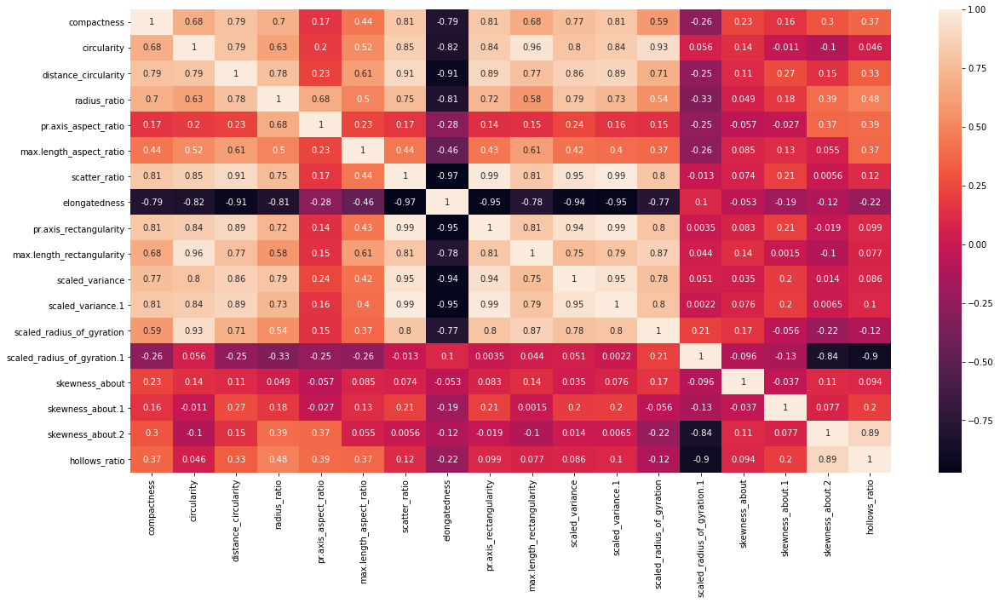

In [56]:
plt.figure(figsize = (20,10))

sns.heatmap(data = data.iloc[:,:-1].corr(), annot = True);

We can see that there is a correlation between variables. Only a few which are not correaletd with any variables such as scaled_radius_of_gyration.1, skewness_about, skewness_about.1

#### 3. Classifier: Design and train a best fit SVM classier using all the data attributes.

In [57]:
# Let us scale the data with z-score

data_z = data.iloc[:, :-1].apply(zscore)

In [58]:
# Let us build a model by SVM

X = data_z.iloc[:,:-1]
y = data.iloc[:, -1:]

X, y = np.array(X), np.array(y).ravel()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 10)
clf = svm.SVC(gamma = 0.1, C = 2, random_state = 10)
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print(clf.score(X_train, y_train).round(4))
print(clf.score(X_test, y_test).round(4))

0.9899
0.9764


Test and train both are giving good accuracy. But as dimensions are more lets use dimensional reduction technique PCA and let us check accuracy.

#### 4. Dimensional reduction: perform dimensional reduction on the data.

In [59]:
# Check explained variance

pca = PCA(n_components = 18)
pca.fit(data_z)
pca.explained_variance_ratio_.round(3)

array([0.538, 0.183, 0.066, 0.065, 0.049, 0.041, 0.019, 0.012, 0.007,
       0.005, 0.003, 0.003, 0.002, 0.002, 0.001, 0.001, 0.001, 0.   ])

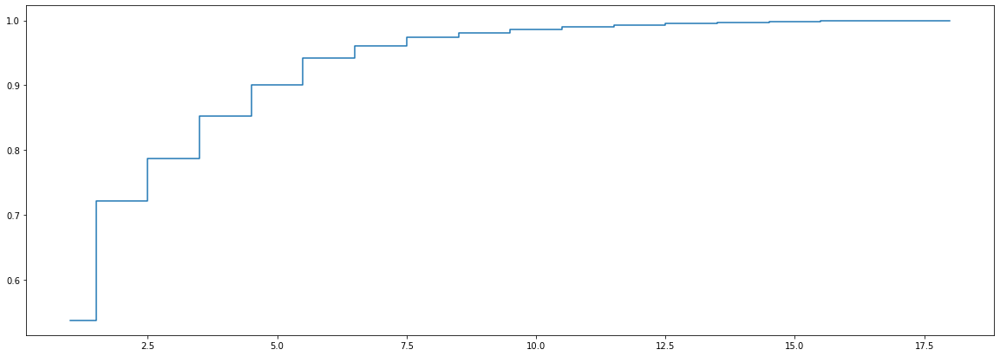

In [60]:
# Plot graph of cumulative variance explained and dimensions.

plt.figure(figsize = (20,7))
plt.step(list(range(1,19)), np.cumsum(pca.explained_variance_ratio_), where = 'mid');

We have already got 97% accuracy without dimension reduction. It depends on the purpose for which we want to reduce dimensions. If we want to reduce computational time and accuracy doesnt matter much then we can go for 6 or 7 dimensions. But if we want more accuracy than it was earlier we will have to go for 12 or 13 dimensions.

We want to classify and it is okay to have a low score so we will go for 7 dimensions.

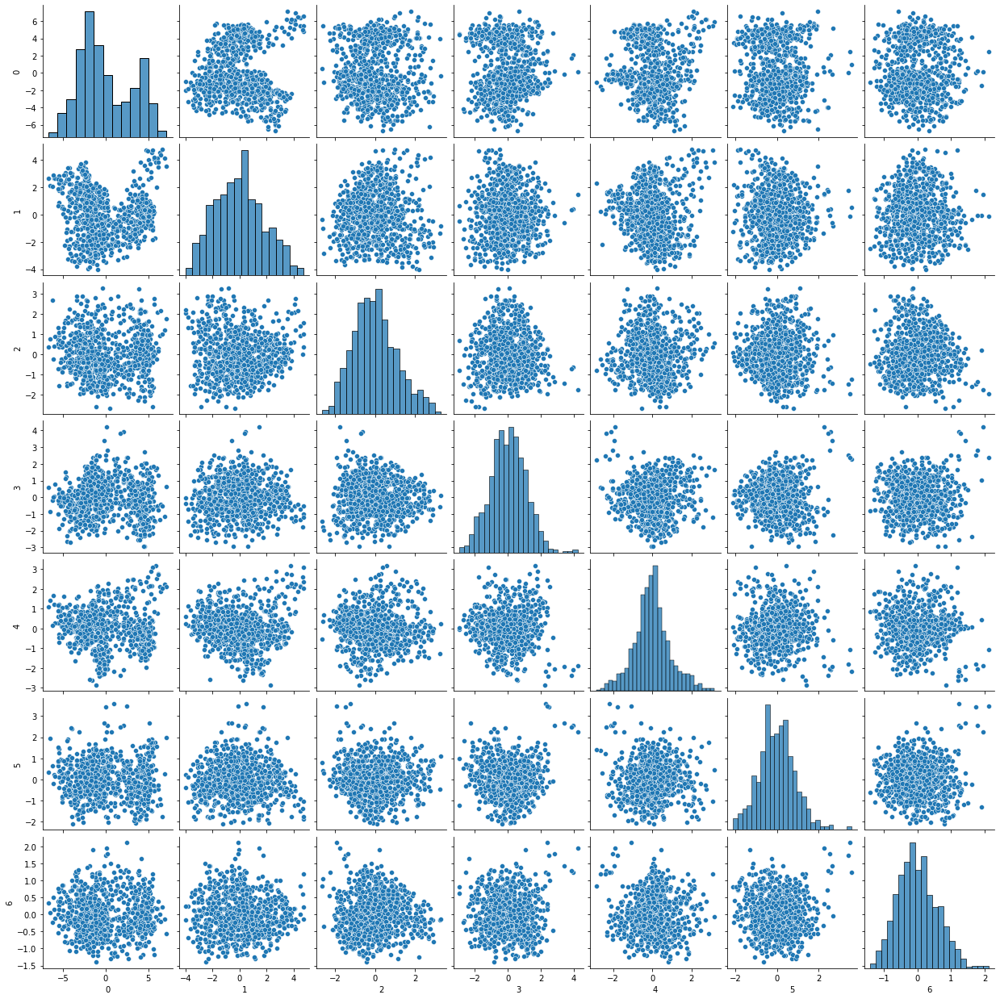

In [61]:
# Let us check pairplot for 5 dimensions.

pca5 = PCA(n_components = 7)
pca5.fit(data_z)
pca5.explained_variance_ratio_.round(3)

xpca5 = pca5.transform(data_z)

sns.pairplot(pd.DataFrame(xpca5));

All the variables are independent of each other. There is no correlation between them.

And they are almost normally distributed.

#### 5. Classifier: Design and train a best fit SVM classier using dimensionally reduced attributes.

In [62]:
clf = svm.SVC(gamma = 0.12, C = .7, random_state = 10)
X = xpca5
y = data['class'].ravel()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 10)
clf.fit(X_train, y_train)
print(clf.score(X_train, y_train).round(4))
print(clf.score(X_test, y_test).round(4))

0.9493
0.9213


Earlier we were getting accuracy of around 97% but now it has reduced to around 92%.

If we want to improve accuracy we can go for more dimensions.

#### 6. Conclusion: Showcase key pointer on how dimensional reduction helped in this case.

Dimensional reduction helps making variables independent of each other. Also it reduces computational time.

As in our example we were getting good results with dimensions. But with PCA the accuracy has reduced however our computational time has reduced.

# Part 4
[ Total Score: 5 points]

Company X is a sports management company for international cricket. 

Goal is to build a data driven batsman ranking model for the sports management company to make business decisions.

1. EDA and visualisation: Create a detailed performance report using univariate, bi-variate and multivariate EDA techniques. Find out all possible hidden patterns by using all possible methods.
2. Build a data driven model to rank all the players in the dataset using all or the most important performance features.

In [63]:
# Let us import data

data = pd.read_csv('Part4 - batting_bowling_ipl_bat.csv')
data.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [64]:
# Checking for null values. We see Null rows.

data.isnull().sum()

Name     90
Runs     90
Ave      90
SR       90
Fours    90
Sixes    90
HF       90
dtype: int64

In [65]:
# Let us drop alternate blank rows

data.dropna(inplace = True)
data.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
5,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0
7,CL White,479.0,43.54,149.68,41.0,20.0,5.0
9,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0


In [66]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 90 entries, 1 to 179
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    90 non-null     object 
 1   Runs    90 non-null     float64
 2   Ave     90 non-null     float64
 3   SR      90 non-null     float64
 4   Fours   90 non-null     float64
 5   Sixes   90 non-null     float64
 6   HF      90 non-null     float64
dtypes: float64(6), object(1)
memory usage: 5.6+ KB


In [67]:
data.describe()

,Runs,Ave,SR,Fours,Sixes,HF
count,90.000000,90.000000,90.000000,90.000000,90.000000,90.000000
mean,219.933333,24.729889,119.164111,19.788889,7.577778,1.188889
std,156.253669,13.619215,23.656547,16.399845,8.001373,1.688656
min,2.000000,0.500000,18.180000,0.000000,0.000000,0.000000
25%,98.000000,14.665000,108.745000,6.250000,3.000000,0.000000
50%,196.500000,24.440000,120.135000,16.000000,6.000000,0.500000
75%,330.750000,32.195000,131.997500,28.000000,10.000000,2.000000
max,733.000000,81.330000,164.100000,73.000000,59.000000,9.000000


Data looks okay with some outliers. In Runs minimum runs are 2, which is a bit suceptible and max is 733.

In [68]:
# Dropping column 'Name'

data1 = data.drop('Name', axis = 1)
data1.head()

,Runs,Ave,SR,Fours,Sixes,HF
1,733.0,61.08,160.74,46.0,59.0,9.0
3,590.0,36.87,143.55,64.0,17.0,6.0
5,495.0,33.00,161.23,57.0,19.0,5.0
7,479.0,43.54,149.68,41.0,20.0,5.0
9,569.0,40.64,129.61,58.0,18.0,5.0


In [69]:
# Scaling the data

data2 = data1.apply(zscore)
data2.head()

,Runs,Ave,SR,Fours,Sixes,HF
1,3.301945,2.683984,1.767325,1.607207,6.462679,4.651551
3,2.381639,0.896390,1.036605,2.710928,1.184173,2.865038
5,1.770248,0.610640,1.788154,2.281703,1.435530,2.269533
7,1.667276,1.388883,1.297182,1.300618,1.561209,2.269533
9,2.246490,1.174755,0.444038,2.343021,1.309851,2.269533


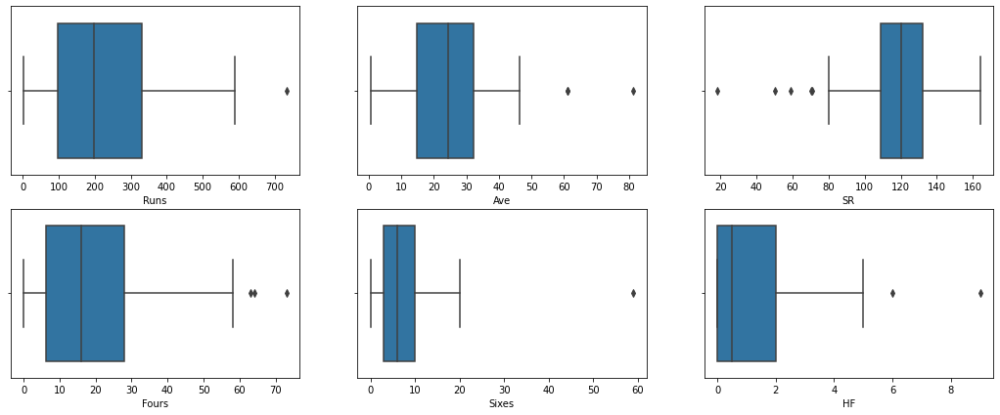

In [70]:
# Plotting box plot to get some clarity about data

plt.figure(figsize = (18,7))
i = 1
for j in data1.describe().T.index:
    plt.subplot(2, 3, i)
    sns.boxplot(data = data1, x = j)
    i += 1

We see few outliers but we will not treat them as we need to rank players on the basis of their performance

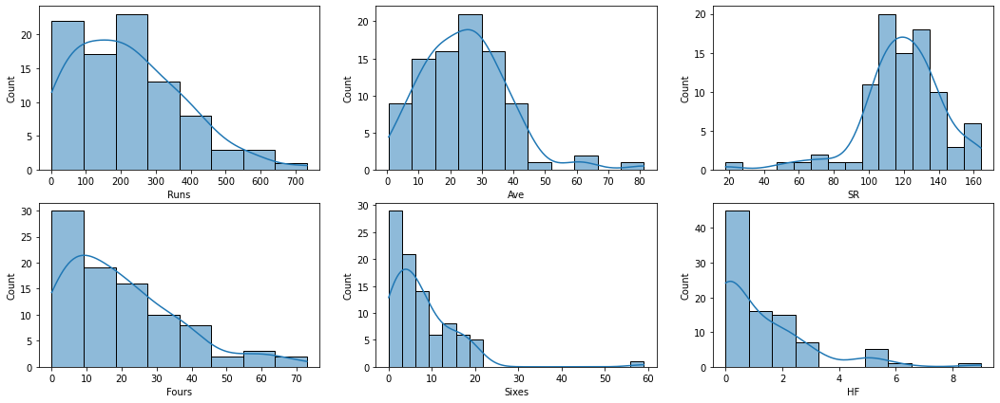

In [71]:
# Let us check distribution

plt.figure(figsize = (18, 7))
i = 1
for j in data1.describe().T.index:
    plt.subplot(2, 3, i)
    sns.histplot(data1, x = j, kde = True)
    i += 1

Data is skewed to one side. As we need to rank batsmans, more the count better the batsman.

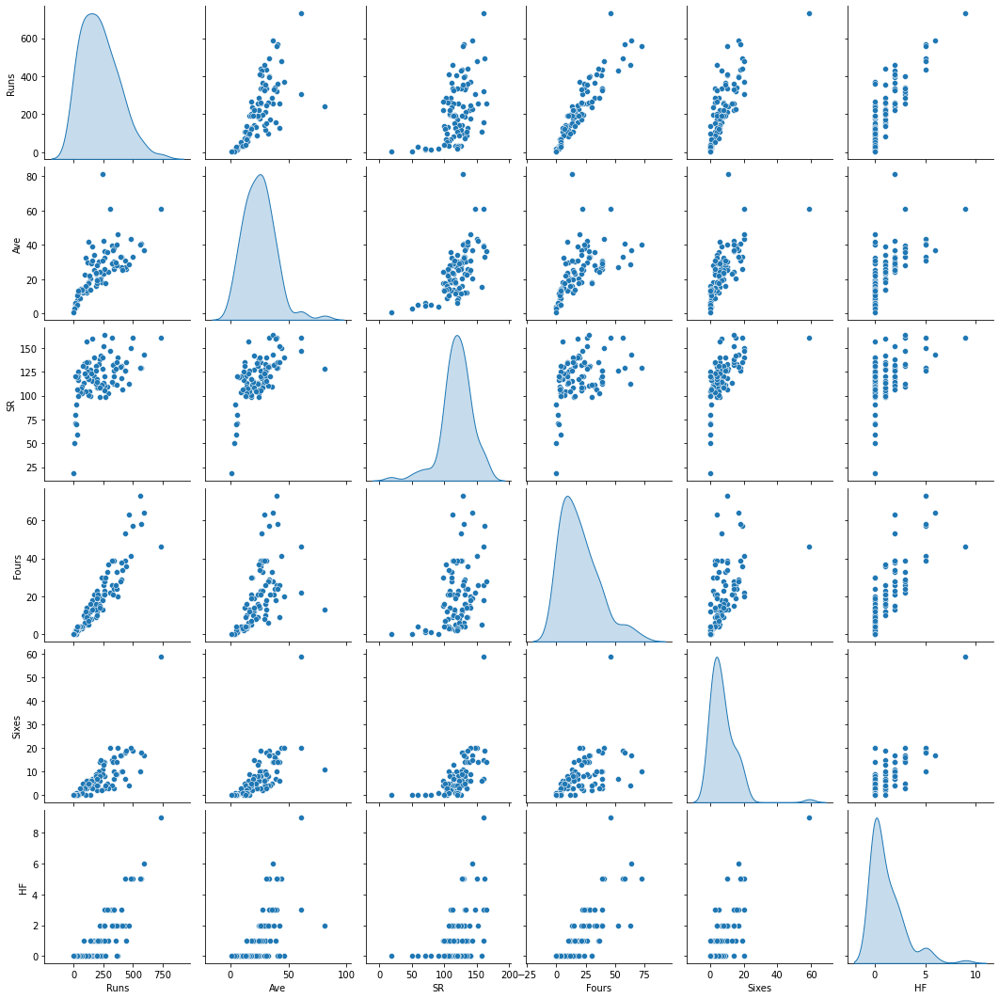

In [72]:
sns.pairplot(data1, diag_kind = 'kde');

Runs and Fours are lineraly correlated. Other variables are also slightly correlated to each other

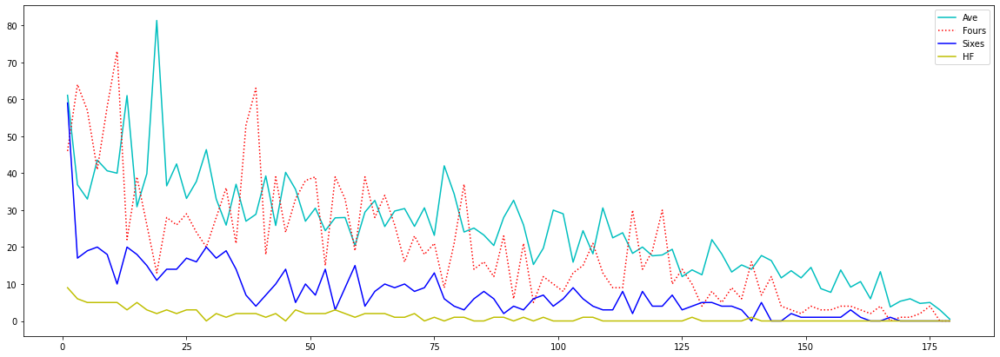

In [73]:
plt.figure(figsize = (20,7))
fig, ax = plt.figure, plt.axes()

ax.plot(data1['Ave'], '-c', label = 'Ave')
ax.plot(data1['Fours'], ':r', label = 'Fours')
ax.plot(data1['Sixes'], '-b', label = 'Sixes')
ax.plot(data1['HF'], '-y', label = 'HF')

plt.legend();

Average, Fours, Sixes and Half century: We see that All the 4 variables are kind of related to each other. All the values are reducing with increasing index

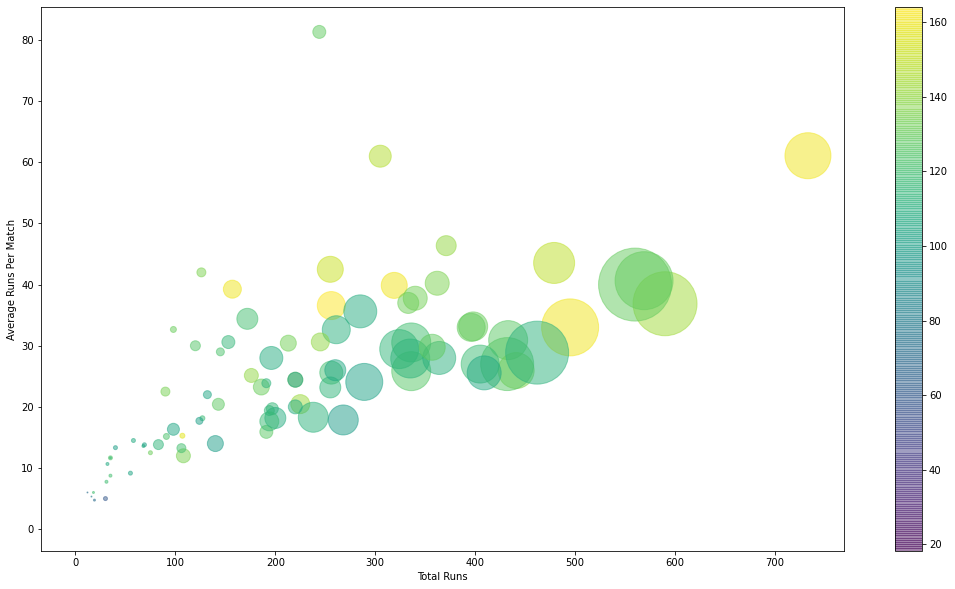

In [74]:
plt.figure(figsize = (18,10))
fig, ax = plt.figure, plt.axes()

plt.scatter(data1['Runs'], data1['Ave'], cmap = 'viridis', s = data1['Fours']**2, 
            alpha = 0.5, c = data1['SR']);
ax.set(xlabel = 'Total Runs', ylabel = 'Average Runs Per Match')
plt.colorbar();

More the average runs per match is good, it shows consistency and ability of a player.

More strike rate better the total runs.

In [75]:
data2.head()

,Runs,Ave,SR,Fours,Sixes,HF
1,3.301945,2.683984,1.767325,1.607207,6.462679,4.651551
3,2.381639,0.896390,1.036605,2.710928,1.184173,2.865038
5,1.770248,0.610640,1.788154,2.281703,1.435530,2.269533
7,1.667276,1.388883,1.297182,1.300618,1.561209,2.269533
9,2.246490,1.174755,0.444038,2.343021,1.309851,2.269533


In [76]:
km = KMeans(n_clusters = 6, random_state = 1)
km.fit(data2)
labels6 = km.labels_

In [77]:
data1['Clust6_k'] = labels6
data['Clust6_k'] = labels6

data_mean = data1.groupby('Clust6_k').mean().round(2)
data_mean['Freq_k'] = data1.Clust6_k.value_counts().sort_index()

data_mean

,Runs,Ave,SR,Fours,Sixes,HF,Freq_k
Clust6_k,,,,,,,
0,44.86,9.39,94.04,3.76,0.81,0.05,21
1,521.00,37.50,140.00,55.33,17.00,5.17,6
2,352.80,28.25,116.94,37.33,7.73,1.93,15
3,168.97,22.53,121.82,13.82,5.74,0.32,34
4,733.00,61.08,160.74,46.00,59.00,9.00,1
5,304.31,42.50,142.55,22.62,14.85,2.00,13


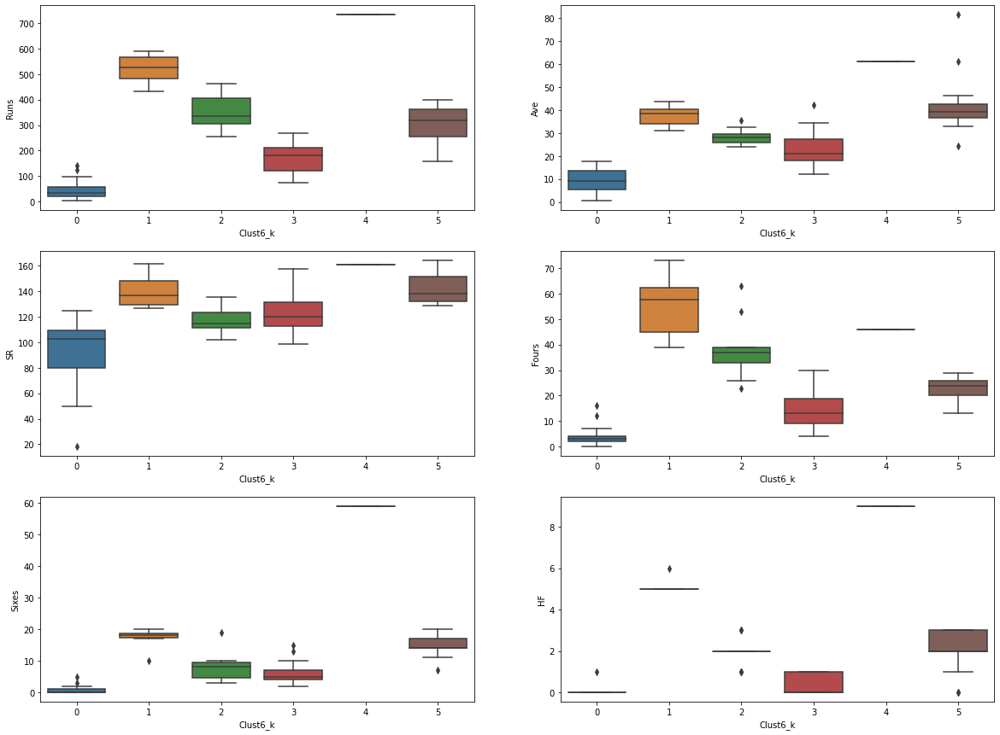

In [78]:
plt.figure(figsize = (20,15))
i = 1
for j in data1.describe().T.index:
    plt.subplot(3, 2, i)
    sns.boxplot(data = data1, x = 'Clust6_k', y = j, saturation = 0.6)
    i += 1
    if i > 6:
        break

Cluster 0: Very low performance in everything.

Cluster 3: After Cluster 0 performance Cluster 3 has a rank in low performance.

Cluster 2: This is better than Cluster 3.

Cluster 5: This is better than Cluster 2.
It is difficult to decide rank of cluster 2 and 5. Because Runs are more in cluster 2 but Average runs are more for cluster 5. Fours are more for cluster 2 but Sixes are more for cluster 5.
So let us give importance to cluster 5 than cluster 2.

Cluster 1: This has second best performance.

Cluster 4: We have only 1 player in this cluster but this player is best in everything. So we will rank 1 for this.

In [79]:
# Let us give rankings to the clusters

data['Clust6_k'] = data['Clust6_k'].replace({0: 'Rank 6', 1: 'Rank 2', 2: 'Rank 4', 3: 'Rank 5', 
                                             4: 'Rank 1', 5: 'Rank 3'} )

data_final = data.groupby('Clust6_k').mean().round(2)
data_final['Freq'] = data.Clust6_k.value_counts()
data_final

,Runs,Ave,SR,Fours,Sixes,HF,Freq
Clust6_k,,,,,,,
Rank 1,733.00,61.08,160.74,46.00,59.00,9.00,1
Rank 2,521.00,37.50,140.00,55.33,17.00,5.17,6
Rank 3,304.31,42.50,142.55,22.62,14.85,2.00,13
Rank 4,352.80,28.25,116.94,37.33,7.73,1.93,15
Rank 5,168.97,22.53,121.82,13.82,5.74,0.32,34
Rank 6,44.86,9.39,94.04,3.76,0.81,0.05,21


We have segregated the data based on rankings.

All the variables are reducing as rank goes down. In case of Rank 3 and 4, we have focused on other attributes than just total runs.

If we want small clusters we can use large k value.

# Part 5

[ Total Score: 5 points]

1. List down all possible dimensionality reduction techniques that can be implemented using python.

2. So far you have used dimensional reduction on numeric data. Is it possible to do the same on a multimedia data [images and video] and text data ? Please illustrate your findings using a simple implementation on python.

**Answer:**
    
1. Dimensionality Reduction Techniques:
    a. PCA (Principle component analysis): It mergest two or more columns with giving more importance to some and less to some and creates new dimensions.
    b. Lasso: Gives different weights to different variables.
    c. Ridge: Skips or drops some variables.
    d. High correlation filter: We can drop columns which are highly corelated to each other as it provides similar information. 
    e. Low variance filter: We can drop variables which have low variance. It carries very less information.
            

2. Yes we can use dimensional reduction in multimedia data and text data.
    
    Images:
    Image is a combination of pixels. When it is stored it is stored in pixel value, if we have more images it will create those many pixels. But in dimensionality reduction, it creates a matrix to work with. It combines all the images and it helps to reduce dimensions.

    Text Data to identify similar documents:
    We can create clusters by providing documents as input using unsupervised learning techniques. We can apply PCA for dimensionality reduction.